In [1]:
import os
os.environ.setdefault("PYTORCH_ENABLE_MPS_FALLBACK", "1")

import random
import subprocess
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from PIL import Image
import time
from datetime import timedelta
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

In [2]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Device: {device}")

Device: mps


In [3]:
PROJECT_ROOT   = "."
DATASET_ROOT   = "vimeo_triplet/"
TRAIN_LIST     = DATASET_ROOT + "tri_trainlist.txt"
TEST_LIST      = DATASET_ROOT + "tri_testlist.txt"
MODEL_PATH     = DATASET_ROOT + "hgvfi_model.pt"

plt.rcParams.update({
    "figure.dpi": 120,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "font.size": 11,
})

In [4]:
def load_vimeo_triplet(dataset_root, list_file, limit=None):
    data = []
    with open(list_file) as f:
        for i, line in enumerate(f):
            if limit and i >= limit:
                break
            triplet_path = line.strip()
            seq_dir = os.path.join(dataset_root, "sequences", triplet_path)
            im1 = os.path.join(seq_dir, "im1.png")
            im2 = os.path.join(seq_dir, "im2.png")
            im3 = os.path.join(seq_dir, "im3.png")
            if os.path.exists(im1) and os.path.exists(im2) and os.path.exists(im3):
                data.append((im1, im2, im3))
    return data

In [5]:
# Compress frame using `Constant Rate Factor`
def compress_frame_h264(frame_np, crf=23):
    h, w = frame_np.shape[:2]
    raw = (frame_np * 255).clip(0, 255).astype(np.uint8).tobytes()

    encode_proc = subprocess.Popen(
        ["ffmpeg", "-y", "-loglevel", "error",
         "-f", "rawvideo", "-vcodec", "rawvideo",
         "-s", f"{w}x{h}", "-pix_fmt", "rgb24", "-i", "pipe:0",
         "-vcodec", "libx264", "-crf", str(crf), "-preset", "ultrafast",
         "-f", "mp4", "-movflags", "frag_keyframe+empty_moov", "pipe:1"],
        stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE,
    )
    encoded, _ = encode_proc.communicate(raw)

    decode_proc = subprocess.Popen(
        ["ffmpeg", "-y", "-loglevel", "error",
         "-i", "pipe:0", "-f", "rawvideo", "-pix_fmt", "rgb24", "pipe:1"],
        stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE,
    )
    decoded_raw, _ = decode_proc.communicate(encoded)
    decoded = np.frombuffer(decoded_raw[:h*w*3], dtype=np.uint8).reshape(h, w, 3)
    return decoded.astype(np.float32) / 255.0

In [6]:
def downsample_hint(frame_np, factor=4):
    img = Image.fromarray((frame_np * 255).astype(np.uint8))
    h, w = frame_np.shape[:2]
    try:
        bicubic = Image.Resampling.BICUBIC
    except AttributeError:
        bicubic = Image.BICUBIC
    img_small = img.resize((w // factor, h // factor), bicubic)
    return np.array(img_small).astype(np.float32) / 255.0

In [7]:
def numpy_to_tensor(np_array):
    return torch.from_numpy(np_array.transpose(2, 0, 1)).float().unsqueeze(0)

def tensor_to_numpy(tensor):
    return tensor.squeeze(0).permute(1, 2, 0).detach().cpu().numpy()

In [8]:
def compute_metrics(gt, pred):
    gt   = np.clip(gt,   0, 1)
    pred = np.clip(pred, 0, 1)
    gt_u8   = (gt   * 255).astype(np.uint8)
    pred_u8 = (pred * 255).astype(np.uint8)
    psnr = peak_signal_noise_ratio(gt_u8, pred_u8, data_range=255)
    ssim = structural_similarity(gt_u8, pred_u8, data_range=255, channel_axis=2)
    return psnr, ssim

In [9]:
def upsample_hint_bicubic(hint_np, scale=4):
    t  = torch.from_numpy(hint_np.transpose(2, 0, 1)).unsqueeze(0).float()
    up = F.interpolate(t, scale_factor=scale, mode="bicubic", align_corners=False)
    return up.squeeze(0).permute(1, 2, 0).numpy().clip(0, 1)

In [10]:
train_paths = load_vimeo_triplet(DATASET_ROOT, TRAIN_LIST)
test_paths  = load_vimeo_triplet(DATASET_ROOT, TEST_LIST)

print(f"Dataset Size:")
print(f"  Training triplets : {len(train_paths):>8,}")
print(f"  Test triplets     : {len(test_paths):>8,}")
print(f"  Total triplets    : {len(train_paths) + len(test_paths):>8,}")

sample_img = np.array(Image.open(train_paths[0][0]))
h, w, c = sample_img.shape
print(f"\nFrame Properties:")
print(f"  Resolution        : {w}×{h} pixels (W×H)")
print(f"  Channels          : {c} (RGB)")
print(f"  Hint resolution   : {w//4}×{h//4} pixels (1/16 original size)")
print(f"  Total pixels/frame: {h * w:,}")
print(f"  Hint pixels       : {(h//4) * (w//4):,} ({100*(h//4)*(w//4)/(h*w):.1f}% of original)")

bytes_per_frame = os.path.getsize(train_paths[0][0])
total_frames = (len(train_paths) + len(test_paths)) * 3
total_size_mb = (bytes_per_frame * total_frames) / (1024 ** 2)
total_size_gb = total_size_mb / 1024

print(f"\nStorage:")
print(f"  Avg frame size    : {bytes_per_frame / 1024:.1f} KB")
print(f"  Total frames      : {total_frames:,} (3 per triplet)")
print(f"  Dataset size      : {total_size_gb:.2f} GB")

train_pct = 100 * len(train_paths) / (len(train_paths) + len(test_paths))
test_pct = 100 - train_pct
print(f"\nTrain/Test Split:")
print(f"  Training          : {train_pct:.1f}%")
print(f"  Test              : {test_pct:.1f}%")

Dataset Size:
  Training triplets :   51,313
  Test triplets     :    3,782
  Total triplets    :   55,095

Frame Properties:
  Resolution        : 448×256 pixels (W×H)
  Channels          : 3 (RGB)
  Hint resolution   : 112×64 pixels (1/16 original size)
  Total pixels/frame: 114,688
  Hint pixels       : 7,168 (6.2% of original)

Storage:
  Avg frame size    : 199.5 KB
  Total frames      : 165,285 (3 per triplet)
  Dataset size      : 31.45 GB

Train/Test Split:
  Training          : 93.1%
  Test              : 6.9%


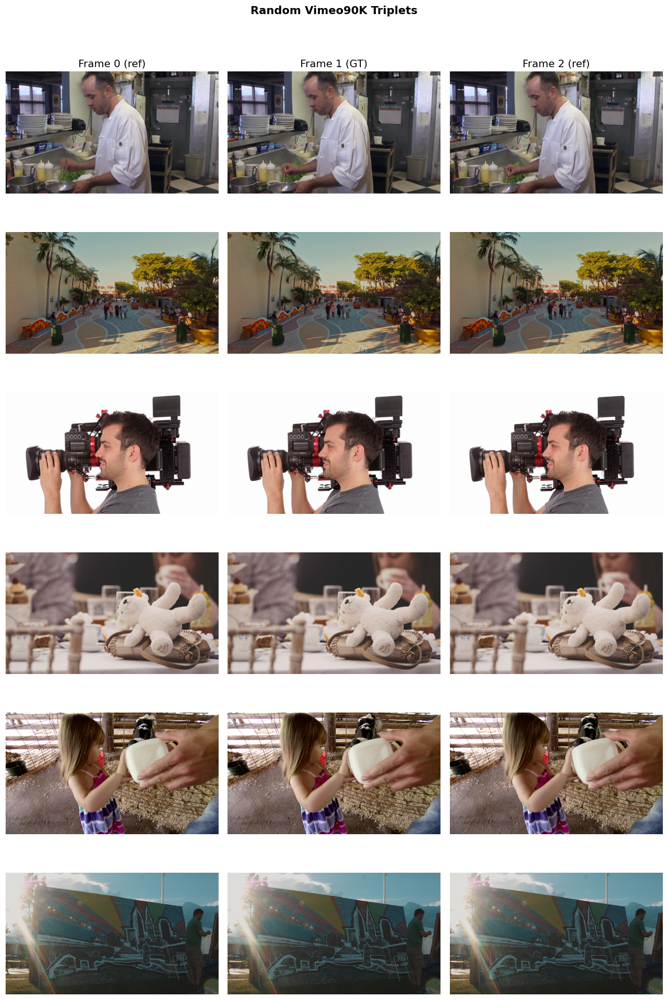

In [129]:
random_samples = random.sample(test_paths, 6)

fig, axes = plt.subplots(6, 3, figsize=(12, 18))

for row, (im1p, im2p, im3p) in enumerate(random_samples):
    for col, (path, title) in enumerate([
        (im1p, "Frame 0 (ref)"),
        (im2p, "Frame 1 (GT)"),
        (im3p, "Frame 2 (ref)")
    ]):
        img = np.array(Image.open(path))
        axes[row, col].imshow(img)
        axes[row, col].set_title(title if row == 0 else "")
        axes[row, col].axis("off")

fig.suptitle("Random Vimeo90K Triplets", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

In [12]:
ref_frame = np.array(Image.open(test_paths[0][1])).astype(np.float32) / 255.0

# Constant Rate Factor
CRF_VALUES = [0, 10, 18, 23, 30, 45]

compressed_frames = {}
psnr_by_crf = {}

for crf in CRF_VALUES:
    comp = compress_frame_h264(ref_frame, crf=crf)
    compressed_frames[crf] = comp
    psnr, _ = compute_metrics(ref_frame, comp)
    psnr_by_crf[crf] = psnr
    print(f"CRF {crf:2d} → PSNR {psnr:.2f} dB")

CRF  0 → PSNR 52.56 dB
CRF 10 → PSNR 47.40 dB
CRF 18 → PSNR 43.53 dB
CRF 23 → PSNR 41.00 dB
CRF 30 → PSNR 37.28 dB
CRF 45 → PSNR 30.14 dB


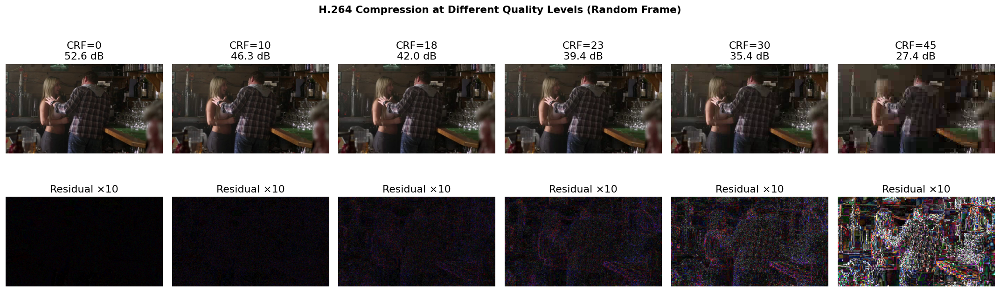

In [13]:
fig, axes = plt.subplots(2, len(CRF_VALUES), figsize=(18, 6))

_, im2p, _ = random.choice(test_paths)
ref_frame = np.array(Image.open(im2p)).astype(np.float32) / 255.0

for col, crf in enumerate(CRF_VALUES):
    comp = compress_frame_h264(ref_frame, crf=crf)
    psnr, _ = compute_metrics(ref_frame, comp)

    axes[0, col].imshow(comp.clip(0, 1))
    axes[0, col].set_title(f"CRF={crf}\n{psnr:.1f} dB")
    axes[0, col].axis("off")

    residual = np.abs(ref_frame - comp) * 10
    axes[1, col].imshow(residual.clip(0, 1), cmap="hot")
    axes[1, col].set_title("Residual ×10")
    axes[1, col].axis("off")

axes[0, 0].set_ylabel("Compressed", fontsize=10)
axes[1, 0].set_ylabel("Residual (hot)", fontsize=10)

fig.suptitle("H.264 Compression at Different Quality Levels (Random Frame)", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

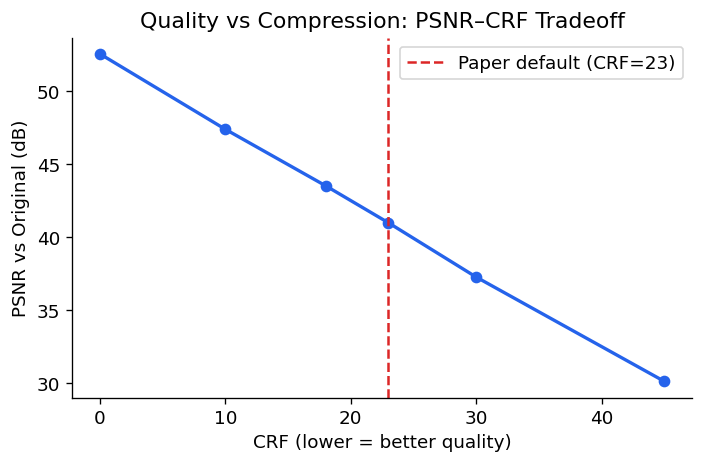

In [14]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(CRF_VALUES, [psnr_by_crf[c] for c in CRF_VALUES], "o-", color="#2563eb", lw=2)
ax.axvline(23, color="#dc2626", ls="--", lw=1.5, label="Paper default (CRF=23)")
ax.set_xlabel("CRF (lower = better quality)")
ax.set_ylabel("PSNR vs Original (dB)")
ax.set_title("Quality vs Compression: PSNR–CRF Tradeoff")
ax.legend()
plt.tight_layout()
plt.show()

Compressed  → PSNR 41.00 dB, SSIM 0.9649
BicubicHint → PSNR 31.90 dB,  SSIM 0.8868


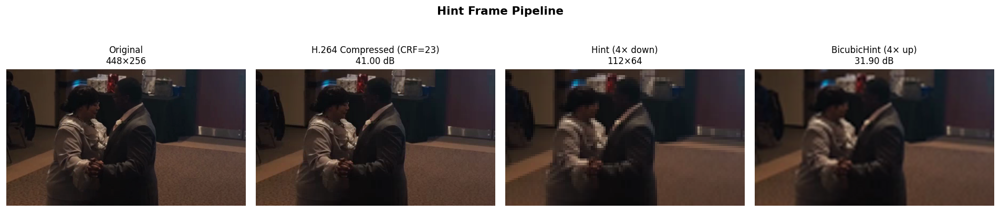

In [15]:
gt_frame    = np.array(Image.open(test_paths[0][1])).astype(np.float32) / 255.0
compressed  = compress_frame_h264(gt_frame, crf=23)
hint        = downsample_hint(compressed, factor=4)
hint_up     = upsample_hint_bicubic(hint, scale=4)

psnr_comp, ssim_comp   = compute_metrics(gt_frame, compressed)
psnr_up,   ssim_up     = compute_metrics(gt_frame, hint_up)
print(f"Compressed  → PSNR {psnr_comp:.2f} dB, SSIM {ssim_comp:.4f}")
print(f"BicubicHint → PSNR {psnr_up:.2f} dB,  SSIM {ssim_up:.4f}")

stages = [
    (gt_frame,   f"Original\n{gt_frame.shape[1]}×{gt_frame.shape[0]}"),
    (compressed, f"H.264 Compressed (CRF=23)\n{psnr_comp:.2f} dB"),
    (hint,       f"Hint (4× down)\n{hint.shape[1]}×{hint.shape[0]}"),
    (hint_up,    f"BicubicHint (4× up)\n{psnr_up:.2f} dB"),
]

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for ax, (img, title) in zip(axes, stages):
    ax.imshow(img.clip(0, 1))
    ax.set_title(title, fontsize=10)
    ax.axis("off")

fig.suptitle("Hint Frame Pipeline", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

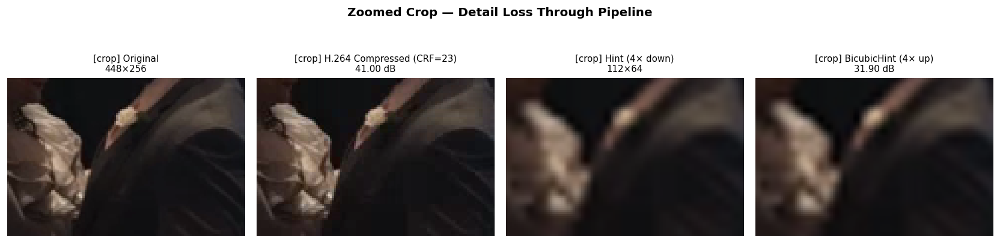

In [16]:
crop_y, crop_x, crop_h, crop_w = 80, 150, 80, 120
fig, axes = plt.subplots(1, 4, figsize=(14, 4))
for ax, (img, title) in zip(axes, stages):
    # Resize hint to match display crop size for fair comparison
    disp = Image.fromarray((img.clip(0,1)*255).astype(np.uint8))
    disp = disp.resize((gt_frame.shape[1], gt_frame.shape[0]), Image.BICUBIC)
    crop = np.array(disp)[crop_y:crop_y+crop_h, crop_x:crop_x+crop_w]
    ax.imshow(crop)
    ax.set_title(f"[crop] {title}", fontsize=9)
    ax.axis("off")

fig.suptitle("Zoomed Crop — Detail Loss Through Pipeline", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()

In [17]:
class CharbonnierLoss(nn.Module):
    """Robust loss: sqrt(diff² + ε²). Better than L2 for outliers/compression artifacts."""
    def __init__(self, eps=1e-6):
        super().__init__()
        self.eps = eps

    def forward(self, pred, target):
        diff = pred - target
        return torch.mean(torch.sqrt(diff * diff + self.eps * self.eps))


class ResidualAttentionBlock(nn.Module):
    """RAB: Conv-BN-ReLU-Conv-BN with Squeeze-and-Excitation channel attention."""
    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, padding=1)
        self.bn1   = nn.BatchNorm2d(channels)
        self.conv2 = nn.Conv2d(channels, channels, 3, padding=1)
        self.bn2   = nn.BatchNorm2d(channels)
        self.se_avg = nn.AdaptiveAvgPool2d(1)
        self.se_fc1 = nn.Linear(channels, channels // 4, bias=False)
        self.se_fc2 = nn.Linear(channels // 4, channels, bias=False)

    def forward(self, x):
        residual = x
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        se  = self.se_avg(out).view(out.size(0), -1)
        se  = torch.sigmoid(self.se_fc2(F.relu(self.se_fc1(se))))
        out = out * se.view(se.size(0), se.size(1), 1, 1)
        return F.relu(out + residual)


class HintBranch(nn.Module):
    """
    Upsample hint from 1/4 res to 3 multi-scale feature maps via PixelShuffle + RABs.
    Input : (B, 3, H/4, W/4)
    Output: s1 (B,64,H/4,W/4), s2 (B,64,H/2,W/2), s3 (B,64,H,W)
    """
    def __init__(self):
        super().__init__()
        self.init_conv = nn.Conv2d(3, 64, 3, padding=1)
        self.rab1      = ResidualAttentionBlock(64)
        self.ps1       = nn.PixelShuffle(2)
        self.reconv1   = nn.Conv2d(16, 64, 3, padding=1)
        self.rab2      = ResidualAttentionBlock(64)
        self.ps2       = nn.PixelShuffle(2)
        self.reconv2   = nn.Conv2d(16, 64, 3, padding=1)
        self.rab3      = ResidualAttentionBlock(64)

    def forward(self, hint):
        f  = F.relu(self.init_conv(hint))
        s1 = self.rab1(f)
        f  = F.relu(self.reconv1(self.ps1(s1)))
        s2 = self.rab2(f)
        f  = F.relu(self.reconv2(self.ps2(s2)))
        s3 = self.rab3(f)
        return s1, s2, s3


class CrossFrameAttention(nn.Module):
    """Bidirectional cross-frame attention at 1/8 scale for motion reasoning."""
    def __init__(self, dim, num_heads=8):
        super().__init__()
        self.norm  = nn.LayerNorm(dim)
        self.attn  = nn.MultiheadAttention(dim, num_heads, batch_first=True)
        self.ffn1  = nn.Linear(dim, 4 * dim)
        self.ffn2  = nn.Linear(4 * dim, dim)

    def forward(self, f0, f2):
        B, C, H, W = f0.shape
        f0_seq = f0.permute(0, 2, 3, 1).reshape(B, H*W, C)
        f2_seq = f2.permute(0, 2, 3, 1).reshape(B, H*W, C)
        attn_out, _ = self.attn(self.norm(f0_seq), self.norm(f2_seq), self.norm(f2_seq))
        attn_out = attn_out + f0_seq
        ffn_out  = self.ffn2(F.relu(self.ffn1(attn_out))) + attn_out
        return ffn_out.reshape(B, H, W, C).permute(0, 3, 1, 2)


class FlowEstimator(nn.Module):
    """Lightweight CNN: predicts bidirectional flow at 1/8 scale."""
    def __init__(self, in_channels):
        super().__init__()
        self.conv1    = nn.Conv2d(in_channels, 128, 3, padding=1)
        self.conv2    = nn.Conv2d(128, 64, 3, padding=1)
        self.flow_out = nn.Conv2d(64, 4, 3, padding=1)

    def forward(self, x):
        return self.flow_out(F.relu(self.conv2(F.relu(self.conv1(x)))))


class WarpLayer(nn.Module):
    """Bilinear grid-sample warping."""
    def forward(self, feat, flow):
        B, C, H, W = feat.shape
        gy, gx = torch.meshgrid(
            torch.linspace(-1, 1, H, device=feat.device),
            torch.linspace(-1, 1, W, device=feat.device),
            indexing="ij",
        )
        grid   = torch.stack([gx, gy], dim=-1).unsqueeze(0).expand(B, -1, -1, -1)
        flow_n = flow.permute(0, 2, 3, 1) / torch.tensor([W/2, H/2], device=feat.device)
        return F.grid_sample(feat, grid + flow_n, mode="bilinear", align_corners=True)


class EMAVFIBackbone(nn.Module):
    """
    Encoder-decoder with:
      - 4-level stride-2 encoder, 3-ch input — frames encoded independently (fix 1)
      - U-Net-style hint injection at encoder AND decoder (per paper)
      - 8 CrossFrameAttention blocks at 1/8 scale with proper Q=f0, K/V=f2 (fix 2)
      - Flow estimator whose output is now used to warp frames toward t=0.5 (fix 3)
      - Coarse head registered as nn.Module parameter, not created in forward (fix 4)
      - 3-level stride-2 transposed-conv decoder
    """
    def __init__(self):
        super().__init__()
        self.enc1 = nn.Conv2d(3,   32,  3, stride=1, padding=1)
        self.enc2 = nn.Conv2d(32,  64,  3, stride=2, padding=1)
        self.enc3 = nn.Conv2d(64,  128, 3, stride=2, padding=1)
        self.enc4 = nn.Conv2d(128, 256, 3, stride=2, padding=1)

        self.hint_adapter_enc1 = nn.Conv2d(32  + 64, 32,  1)
        self.hint_adapter_enc2 = nn.Conv2d(64  + 64, 64,  1)
        self.hint_adapter_enc3 = nn.Conv2d(128 + 64, 128, 1)
        self.hint_adapter_dec3 = nn.Conv2d(128 + 64, 128, 1)
        self.hint_adapter_dec2 = nn.Conv2d(64  + 64, 64,  1)
        self.hint_adapter_dec1 = nn.Conv2d(32  + 64, 32,  1)

        self.cfa_blocks     = nn.ModuleList([CrossFrameAttention(256) for _ in range(8)])
        self.flow_estimator = FlowEstimator(256)
        self.warp_layer     = WarpLayer()

        self.dec3 = nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1)
        self.dec2 = nn.ConvTranspose2d(128, 64,  4, stride=2, padding=1)
        self.dec1 = nn.ConvTranspose2d(64,  32,  4, stride=2, padding=1)

        self.coarse_head = nn.Conv2d(32, 3, 3, padding=1)

    def _encode_frame(self, frame, s1, s2, s3):
        """Encode one frame through the shared encoder with hint injection."""
        e1 = F.relu(self.enc1(frame))
        if s3 is not None:
            e1 = self.hint_adapter_enc1(torch.cat([e1, s3], dim=1))
        e2 = F.relu(self.enc2(e1))
        if s2 is not None:
            e2 = self.hint_adapter_enc2(torch.cat([e2, s2], dim=1))
        e3 = F.relu(self.enc3(e2))
        if s1 is not None:
            e3 = self.hint_adapter_enc3(torch.cat([e3, s1], dim=1))
        e4 = F.relu(self.enc4(e3))
        return e4

    def forward(self, frame0, frame2, hint_features=None):
        s1, s2, s3 = hint_features if hint_features is not None else (None, None, None)

        e4_0 = self._encode_frame(frame0, s1, s2, s3)  # (B, 256, H/8, W/8)
        e4_2 = self._encode_frame(frame2, s1, s2, s3)

        e4_att = e4_0
        for blk in self.cfa_blocks:
            e4_att = blk(e4_att, e4_2)

        flow_coarse = self.flow_estimator(e4_att)
        H_full, W_full = frame0.shape[2], frame0.shape[3]
        H_c,    W_c    = flow_coarse.shape[2], flow_coarse.shape[3]
        scale_h, scale_w = H_full / H_c, W_full / W_c
        flow_up = F.interpolate(flow_coarse, size=(H_full, W_full),
                                mode="bilinear", align_corners=False)
        flow_up = flow_up * torch.tensor(
            [scale_w, scale_h, scale_w, scale_h], device=flow_up.device
        ).view(1, 4, 1, 1)
        warped0 = self.warp_layer(frame0, flow_up[:, :2] * 0.5)
        warped2 = self.warp_layer(frame2, flow_up[:, 2:] * 0.5)
        warped_blend = (warped0 + warped2) * 0.5

        d3 = F.relu(self.dec3(e4_att))
        if hint_features is not None:
            d3 = self.hint_adapter_dec3(torch.cat([d3, s1], dim=1))
        d2 = F.relu(self.dec2(d3))
        if hint_features is not None:
            d2 = self.hint_adapter_dec2(torch.cat([d2, s2], dim=1))
        d1 = F.relu(self.dec1(d2))
        if hint_features is not None:
            d1 = self.hint_adapter_dec1(torch.cat([d1, s3], dim=1))

        coarse_decoder = torch.sigmoid(self.coarse_head(d1))
        coarse = torch.clamp(0.5 * coarse_decoder + 0.5 * warped_blend, 0.0, 1.0)
        return coarse, [d1]


class RefineNet(nn.Module):
    """
    Residual refinement: coarse_pred + hint_context (s3) + decoder_feat → output.
    Input channels: 3 + 64 + 32 = 99
    """
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3 + 64 + 32, 64, 3, padding=1)
        self.conv2 = nn.Conv2d(64, 64, 3, padding=1)
        self.out   = nn.Conv2d(64, 3, 3, padding=1)

    def forward(self, coarse, hint_ctx, dec_feat):
        x = F.relu(self.conv1(torch.cat([coarse, hint_ctx, dec_feat], dim=1)))
        x = F.relu(self.conv2(x))
        return torch.sigmoid(coarse + self.out(x))


class HintGuidedVFI(nn.Module):
    """
    Full model:
      1. HintBranch   — upsample hint to 3 scales
      2. EMAVFIBackbone — encode frames + inject hint + cross-frame attention + decode
      3. RefineNet    — residual refinement with hint context
    """
    def __init__(self):
        super().__init__()
        self.hint_branch = HintBranch()
        self.backbone    = EMAVFIBackbone()
        self.refine      = RefineNet()

    def forward(self, frame0, frame2, hint):
        s1, s2, s3         = self.hint_branch(hint)
        coarse, dec_feats  = self.backbone(frame0, frame2, (s1, s2, s3))
        return self.refine(coarse, s3, dec_feats[0])

In [18]:
model = HintGuidedVFI().to(device)

def count_params(module):
    return sum(p.numel() for p in module.parameters())

modules = {
    "HintBranch":      model.hint_branch,
    "EMAVFIBackbone":  model.backbone,
    "RefineNet":       model.refine,
    "Total":           model,
}
for name, mod in modules.items():
    print(f"  {name:<20} {count_params(mod):>10,} params")

  HintBranch              248,832 params
  EMAVFIBackbone        7,834,887 params
  RefineNet                95,747 params
  Total                 8,179,466 params


In [19]:
print("Forward pass shape trace:")
B, H, W = 1, 256, 448

f0   = torch.randn(B, 3, H,   W,   device=device)
f2   = torch.randn(B, 3, H,   W,   device=device)
hint = torch.randn(B, 3, H//4, W//4, device=device)

with torch.no_grad():
    s1, s2, s3         = model.hint_branch(hint)
    coarse, dec_feats  = model.backbone(f0, f2, (s1, s2, s3))
    output             = model.refine(coarse, s3, dec_feats[0])

print(f"  hint          : {tuple(hint.shape)}")
print(f"  s1 (1/4 res)  : {tuple(s1.shape)}")
print(f"  s2 (1/2 res)  : {tuple(s2.shape)}")
print(f"  s3 (full res) : {tuple(s3.shape)}")
print(f"  coarse pred   : {tuple(coarse.shape)}")
print(f"  output        : {tuple(output.shape)}")

Forward pass shape trace:
  hint          : (1, 3, 64, 112)
  s1 (1/4 res)  : (1, 64, 64, 112)
  s2 (1/2 res)  : (1, 64, 128, 224)
  s3 (full res) : (1, 64, 256, 448)
  coarse pred   : (1, 3, 256, 448)
  output        : (1, 3, 256, 448)


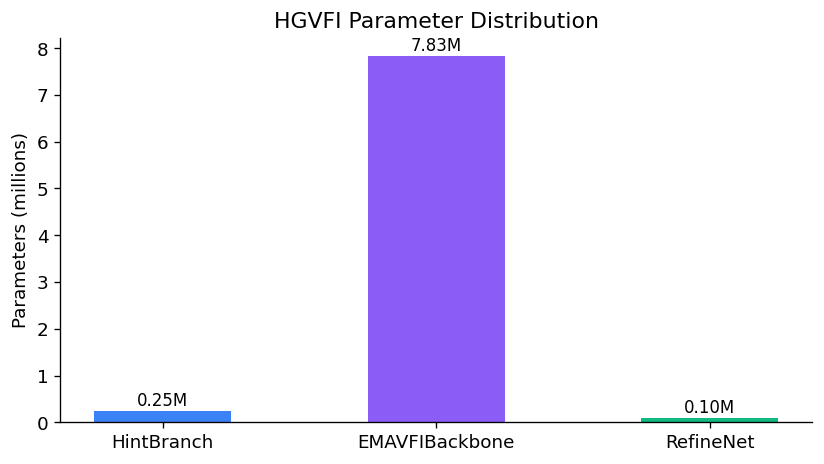

In [20]:
labels  = ["HintBranch", "EMAVFIBackbone", "RefineNet"]
counts  = [count_params(model.hint_branch),
           count_params(model.backbone),
           count_params(model.refine)]
colors  = ["#3b82f6", "#8b5cf6", "#10b981"]

fig, ax = plt.subplots(figsize=(7, 4))
bars = ax.bar(labels, [c/1e6 for c in counts], color=colors, width=0.5)
for bar, c in zip(bars, counts):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
            f"{c/1e6:.2f}M", ha="center", va="bottom", fontsize=10)
ax.set_ylabel("Parameters (millions)")
ax.set_title("HGVFI Parameter Distribution")
plt.tight_layout()
plt.show()

In [21]:
class Vimeo90KDataset(Dataset):
    """
    Loads compressed triplets with optional augmentation:
      - Random 256×256 crop
      - Horizontal flip (50%)
      - Temporal reverse (swap f0 ↔ f2) (50%)
    """
    def __init__(self, image_paths, crop_size=256, use_augmentation=True):
        self.image_paths     = image_paths
        self.crop_size       = crop_size
        self.use_augmentation = use_augmentation

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        im1_path, im2_path, im3_path = self.image_paths[idx]

        def _load_compressed(path):
            cached = path.replace(".png", "_h264.png")
            if os.path.exists(cached):
                return np.array(Image.open(cached)).astype(np.float32) / 255.0
            frame = np.array(Image.open(path)).astype(np.float32) / 255.0
            return compress_frame_h264(frame, crf=23)

        f0  = _load_compressed(im1_path)
        fgt = _load_compressed(im2_path)
        f2  = _load_compressed(im3_path)
        hint = downsample_hint(fgt, factor=4)

        if self.use_augmentation and self.crop_size:
            h, w = f0.shape[:2]
            if h > self.crop_size and w > self.crop_size:
                y = random.randint(0, h - self.crop_size)
                x = random.randint(0, w - self.crop_size)
                s = self.crop_size
                f0   = f0[y:y+s,   x:x+s]
                fgt  = fgt[y:y+s,  x:x+s]
                f2   = f2[y:y+s,   x:x+s]
                hy, hx, hs = y//4, x//4, s//4
                hint = hint[hy:hy+hs, hx:hx+hs]

        if self.use_augmentation and random.random() < 0.5:
            f0, fgt, f2, hint = [a[:, ::-1].copy() for a in [f0, fgt, f2, hint]]

        if self.use_augmentation and random.random() < 0.5:
            f0, f2 = f2.copy(), f0.copy()

        return {
            "frame0": numpy_to_tensor(f0).squeeze(0),
            "frame2": numpy_to_tensor(f2).squeeze(0),
            "hint":   numpy_to_tensor(hint).squeeze(0),
            "gt":     numpy_to_tensor(fgt).squeeze(0),
        }

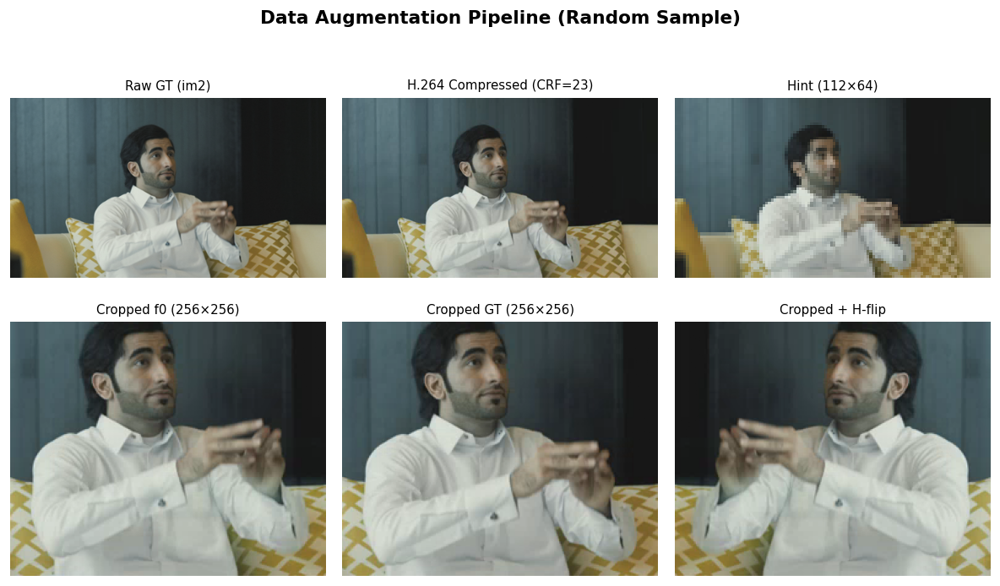

In [22]:
im1p, im2p, im3p = random.choice(test_paths)

raw_f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
raw_gt  = np.array(Image.open(im2p)).astype(np.float32) / 255.0
raw_f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0

comp_f0 = compress_frame_h264(raw_f0, crf=23)
comp_gt = compress_frame_h264(raw_gt, crf=23)
comp_f2 = compress_frame_h264(raw_f2, crf=23)
hint_sm = downsample_hint(comp_gt, factor=4)

y, x, s = 50, 100, 256
crop_f0 = comp_f0[y:y+s, x:x+s]
crop_gt = comp_gt[y:y+s, x:x+s]

flip_f0 = crop_f0[:, ::-1]

stages = [
    (raw_gt,   "Raw GT (im2)"),
    (comp_gt,  "H.264 Compressed (CRF=23)"),
    (hint_sm,  f"Hint ({hint_sm.shape[1]}×{hint_sm.shape[0]})"),
    (crop_f0,  f"Cropped f0 ({s}×{s})"),
    (crop_gt,  f"Cropped GT ({s}×{s})"),
    (flip_f0,  "Cropped + H-flip"),
]

fig, axes = plt.subplots(2, 3, figsize=(10, 6))

for i, (img, title) in enumerate(stages):
    r, c = divmod(i, 3)
    axes[r, c].imshow(img.clip(0, 1))
    axes[r, c].set_title(title, fontsize=9)
    axes[r, c].axis("off")

fig.suptitle("Data Augmentation Pipeline (Random Sample)", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

In [23]:
def train_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    total_loss, n = 0, 0
    epoch_start = time.time()

    loop = tqdm(
        dataloader,
        desc="Training",
        leave=False,
        dynamic_ncols=True
    )

    for i, batch in enumerate(loop):
        batch_start = time.time()

        f0   = batch["frame0"].to(device)
        f2   = batch["frame2"].to(device)
        hint = batch["hint"].to(device)
        gt   = batch["gt"].to(device)

        out  = model(f0, f2, hint)
        loss = loss_fn(out, gt)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        batch_time = time.time() - batch_start

        total_loss += loss.item()
        n += 1

        # Update tqdm bar
        loop.set_postfix({
            "loss": f"{loss.item():.4f}",
            "avg_loss": f"{(total_loss/n):.4f}",
            "batch_time": f"{batch_time:.2f}s"
        })

    epoch_time = time.time() - epoch_start
    return total_loss / n, epoch_time

In [24]:
def validate(model, val_paths, device, num_samples=100):
    model.eval()
    psnr_list, ssim_list = [], []
    val_start = time.time()
    
    with torch.no_grad():
        for i, (im1p, im2p, im3p) in enumerate(val_paths[:num_samples]):
            f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
            fgt = np.array(Image.open(im2p)).astype(np.float32) / 255.0
            f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0
            f0c = compress_frame_h264(f0,  crf=23)
            f2c = compress_frame_h264(f2,  crf=23)
            fgc = compress_frame_h264(fgt, crf=23)
            h   = downsample_hint(fgc, factor=4)

            out = model(numpy_to_tensor(f0c).to(device),
                        numpy_to_tensor(f2c).to(device),
                        numpy_to_tensor(h).to(device))
            psnr, ssim = compute_metrics(fgt, tensor_to_numpy(out))
            psnr_list.append(psnr)
            ssim_list.append(ssim)
    
    val_time = time.time() - val_start
    return np.mean(psnr_list), np.mean(ssim_list), val_time

In [25]:
def run_training(
    train_paths,
    val_paths,
    model,
    device,
    num_epochs=30,
    batch_size=4,
    lr=2e-4,
    limit=None,
):
    training_start = time.time()
    
    if limit:
        train_paths = train_paths[:limit]
        val_paths   = val_paths[:limit]

    train_ds = Vimeo90KDataset(train_paths, crop_size=256, use_augmentation=True)
    loader   = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
    loss_fn   = CharbonnierLoss(eps=1e-6)

    history = {
        "train_loss": [], 
        "val_psnr": [], 
        "val_ssim": [],
        "epoch_times": [],
        "val_times": []
    }

    for epoch in range(1, num_epochs + 1):
        epoch_start = time.time()
        
        train_loss, train_time = train_epoch(model, loader, optimizer, loss_fn, device)
        scheduler.step()
        
        val_psnr, val_ssim, val_time = validate(
            model, val_paths, device, num_samples=min(200, len(val_paths))
        )
        
        epoch_time = time.time() - epoch_start

        history["train_loss"].append(train_loss)
        history["val_psnr"].append(val_psnr)
        history["val_ssim"].append(val_ssim)
        history["epoch_times"].append(train_time)
        history["val_times"].append(val_time)

        print(
            f"Epoch {epoch:02d}/{num_epochs} | "
            f"loss {train_loss:.4f} | "
            f"PSNR {val_psnr:.2f} | "
            f"SSIM {val_ssim:.4f} | "
            f"time {int(epoch_time)}s"
        )

        if epoch % 5 == 0:
            torch.save(model.state_dict(), f"{PROJECT_ROOT}/hgvfi_epoch_{epoch}.pt")

    total_training_time = time.time() - training_start
    
    torch.save(model.state_dict(), MODEL_PATH)
    history["total_time"] = total_training_time

    print(f"\nDone in {int(total_training_time)}s | Final PSNR {history['val_psnr'][-1]:.2f}")

    return history

In [26]:
model1 = HintGuidedVFI().to(device)

In [28]:
history = run_training(_train_paths, test_paths, model1, device, batch_size=4, num_epochs=12, limit=4000)

Training:   0%|                                                                                                                      | 0/1000 [00:00<?, ?it/s]/Users/rsaran/Projects/ivp/venv/lib/python3.14/site-packages/torch/autograd/graph.py:865: UserWarning: The operator 'aten::grid_sampler_2d_backward' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/mps/MPSFallback.mm:15.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
                                                                                                                                                              

Epoch 01/12 | loss 0.0563 | PSNR 26.37 | SSIM 0.7949 | time 1477s


Epoch 02/12 | loss 0.0382 | PSNR 27.05 | SSIM 0.8225 | time 1517s


Epoch 03/12 | loss 0.0322 | PSNR 27.68 | SSIM 0.8307 | time 1550s


Epoch 04/12 | loss 0.0294 | PSNR 28.54 | SSIM 0.8386 | time 1580s


Epoch 05/12 | loss 0.0271 | PSNR 28.76 | SSIM 0.8447 | time 1612s


Epoch 06/12 | loss 0.0259 | PSNR 28.97 | SSIM 0.8477 | time 1643s


Epoch 07/12 | loss 0.0248 | PSNR 29.07 | SSIM 0.8523 | time 1674s


Epoch 08/12 | loss 0.0239 | PSNR 29.38 | SSIM 0.8545 | time 1699s


Epoch 09/12 | loss 0.0233 | PSNR 29.42 | SSIM 0.8542 | time 1726s


Epoch 10/12 | loss 0.0227 | PSNR 29.54 | SSIM 0.8579 | time 1749s


Epoch 11/12 | loss 0.0224 | PSNR 29.65 | SSIM 0.8575 | time 1704s


Epoch 12/12 | loss 0.0222 | PSNR 29.64 | SSIM 0.8581 | time 1720s

Done in 19658s | Final PSNR 29.64


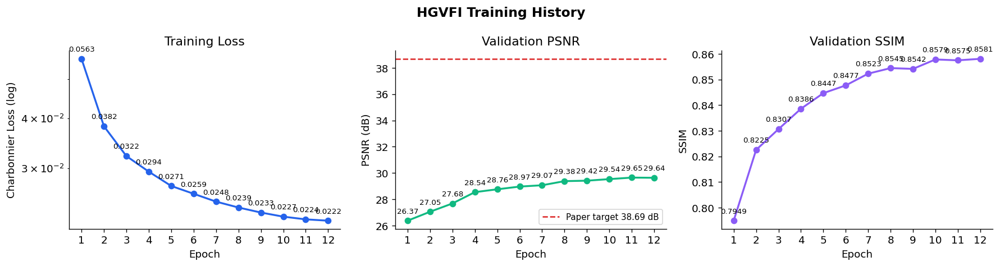

In [131]:
epochs     = list(range(1, len(history["train_loss"]) + 1))
train_loss = history["train_loss"]
val_psnr   = history["val_psnr"]
val_ssim   = history["val_ssim"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = axes[0]
ax.plot(epochs, train_loss, "o-", color="#2563eb", lw=2, ms=6)
for e, v in zip(epochs, train_loss):
    ax.annotate(f"{v:.4f}", (e, v), textcoords="offset points",
                xytext=(0, 8), ha="center", fontsize=8)
ax.set_yscale("log")
ax.set_xlabel("Epoch")
ax.set_ylabel("Charbonnier Loss (log)")
ax.set_title("Training Loss")
ax.set_xticks(epochs)

ax = axes[1]
ax.plot(epochs, val_psnr, "o-", color="#10b981", lw=2, ms=6)
ax.axhline(38.69, ls="--", color="#dc2626", lw=1.5, label="Paper target 38.69 dB")
for e, v in zip(epochs, val_psnr):
    ax.annotate(f"{v:.2f}", (e, v), textcoords="offset points",
                xytext=(0, 8), ha="center", fontsize=8)
ax.set_xlabel("Epoch")
ax.set_ylabel("PSNR (dB)")
ax.set_title("Validation PSNR")
ax.set_xticks(epochs)
ax.legend(fontsize=9)

ax = axes[2]
ax.plot(epochs, val_ssim, "o-", color="#8b5cf6", lw=2, ms=6)
for e, v in zip(epochs, val_ssim):
    ax.annotate(f"{v:.4f}", (e, v), textcoords="offset points",
                xytext=(0, 8), ha="center", fontsize=8)
ax.set_xlabel("Epoch")
ax.set_ylabel("SSIM")
ax.set_title("Validation SSIM")
ax.set_xticks(epochs)

fig.suptitle("HGVFI Training History", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

In [41]:
class SimpleLinearInterpolation:
    def __call__(self, f0, f2):
        return (f0 + f2) / 2.0


class BicubicInterpolation:
    def __call__(self, f0, f2):
        avg = (f0 + f2) / 2.0
        t   = torch.from_numpy(avg.transpose(2, 0, 1)).unsqueeze(0).float()
        h, w = t.shape[2:]
        down = F.interpolate(t, scale_factor=0.5, mode="bicubic", align_corners=False)
        up   = F.interpolate(down, size=(h, w),   mode="bicubic", align_corners=False)
        return up.squeeze(0).permute(1, 2, 0).numpy().clip(0, 1)


class BicubicHintInterpolation:
    def __call__(self, hint):
        return upsample_hint_bicubic(hint, scale=4)

def run_benchmark(model, dataset, device, num_samples=200):
    linear_m  = SimpleLinearInterpolation()
    bicubic_m = BicubicInterpolation()
    bichint_m = BicubicHintInterpolation()

    results = {k: {"psnr": [], "ssim": []} for k in ["Linear", "Bicubic", "BicubicHint", "HGVFI"]}
    model.eval()

    for idx, (im1p, im2p, im3p) in enumerate(dataset[:num_samples]):
        f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
        fgt = np.array(Image.open(im2p)).astype(np.float32) / 255.0
        f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0
        f0c = compress_frame_h264(f0,  crf=23)
        f2c = compress_frame_h264(f2,  crf=23)
        fgc = compress_frame_h264(fgt, crf=23)
        h   = downsample_hint(fgc, factor=4)

        preds = {
            "Linear":      linear_m(f0c, f2c),
            "Bicubic":     bicubic_m(f0c, f2c),
            "BicubicHint": bichint_m(h),
        }
        with torch.no_grad():
            out = model(numpy_to_tensor(f0c).to(device),
                        numpy_to_tensor(f2c).to(device),
                        numpy_to_tensor(h).to(device))
        preds["HGVFI"] = tensor_to_numpy(out)

        for name, pred in preds.items():
            psnr, ssim = compute_metrics(fgt, pred)
            results[name]["psnr"].append(psnr)
            results[name]["ssim"].append(ssim)

        if (idx + 1) % 50 == 0:
            print(f"  {idx+1}/{num_samples}")

    summary = {}
    for name, vals in results.items():
        summary[name] = {
            "psnr_mean": float(np.mean(vals["psnr"])),
            "psnr_std":  float(np.std(vals["psnr"])),
            "ssim_mean": float(np.mean(vals["ssim"])),
            "ssim_std":  float(np.std(vals["ssim"])),
            "psnr_scores": vals["psnr"],
            "ssim_scores": vals["ssim"],
        }
    return summary

In [153]:
model.eval()
scores = []
for im1p, im2p, im3p in tqdm(test_paths[:1000]):
    f0c = compress_frame_h264(np.array(Image.open(im1p)).astype(np.float32)/255.0, crf=23)
    f2c = compress_frame_h264(np.array(Image.open(im3p)).astype(np.float32)/255.0, crf=23)
    fgc = compress_frame_h264(np.array(Image.open(im2p)).astype(np.float32)/255.0, crf=23)
    h   = downsample_hint(fgc, factor=4)
    with torch.no_grad():
        out = model(numpy_to_tensor(f0c).to(device),
                    numpy_to_tensor(f2c).to(device),
                    numpy_to_tensor(h).to(device))
    psnr, _ = compute_metrics(fgc, tensor_to_numpy(out))
    scores.append((psnr, (im1p, im2p, im3p)))


benchmark = run_benchmark(model, test_paths, device, num_samples=10)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [07:04<00:00,  2.35it/s]


In [ ]:
model = HintGuidedVFI().to(device)

if os.path.exists(MODEL_PATH):
    model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
    print(f"Loaded weights from {MODEL_PATH}")
else:
    print("No checkpoint found, using random weights")

benchmark = run_benchmark(model, _test_paths, device, num_samples=400)

In [156]:
print(f"\n{'Method':<15} {'PSNR (dB)':<22} {'SSIM'}")
print("-" * 55)

for method, m in benchmark.items():
    p = f"{m['psnr_mean']:.2f} ± {m['psnr_std']:.2f}"
    s = f"{m['ssim_mean']:.4f} ± {m['ssim_std']:.4f}"
    print(f"{method:<15} {p:<22} {s}")


Method          PSNR (dB)              SSIM
-------------------------------------------------------
Linear          25.25 ± 1.82           0.8313 ± 0.0514
Bicubic         25.33 ± 1.84           0.8310 ± 0.0488
BicubicHint     28.43 ± 1.92           0.8831 ± 0.0406
HGVFI           31.86 ± 1.65           0.9080 ± 0.0275


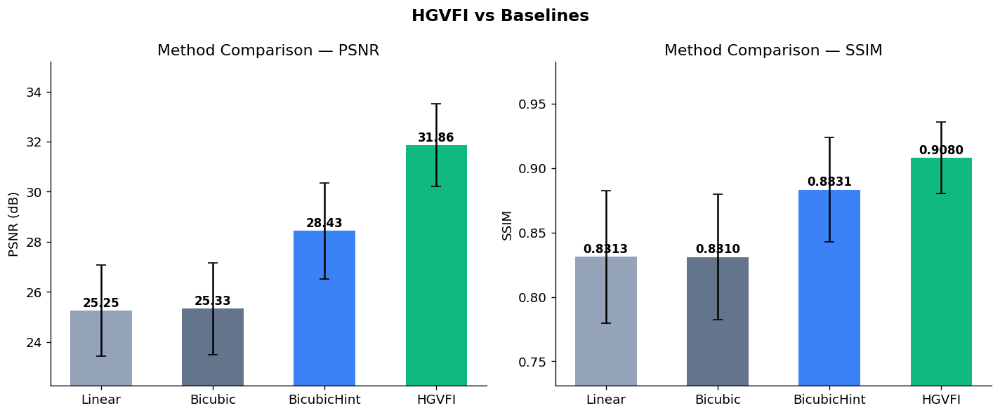

In [157]:
methods = list(benchmark.keys())
psnr_means = [benchmark[m]["psnr_mean"] for m in methods]
psnr_stds  = [benchmark[m]["psnr_std"]  for m in methods]
ssim_means = [benchmark[m]["ssim_mean"] for m in methods]
ssim_stds  = [benchmark[m]["ssim_std"]  for m in methods]
colors     = ["#94a3b8", "#64748b", "#3b82f6", "#10b981"]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

ax = axes[0]
bars = ax.bar(methods, psnr_means, yerr=psnr_stds, color=colors,
              capsize=4, width=0.55, error_kw={"lw": 1.5})
for bar, v in zip(bars, psnr_means):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.15,
            f"{v:.2f}", ha="center", fontsize=10, fontweight="bold")
ax.set_ylabel("PSNR (dB)")
ax.set_title("Method Comparison — PSNR")
ax.set_ylim(bottom=max(0, min(psnr_means) - 3))

ax = axes[1]
bars = ax.bar(methods, ssim_means, yerr=ssim_stds, color=colors,
              capsize=4, width=0.55, error_kw={"lw": 1.5})
for bar, v in zip(bars, ssim_means):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f"{v:.4f}", ha="center", fontsize=10, fontweight="bold")
ax.set_ylabel("SSIM")
ax.set_title("Method Comparison — SSIM")
ax.set_ylim(bottom=max(0, min(ssim_means) - 0.1))

fig.suptitle("HGVFI vs Baselines", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

/var/folders/ns/q0tvr3b54bjdhrw617073pmc0000gn/T/ipykernel_17199/3220260813.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=methods, patch_artist=True, notch=True,


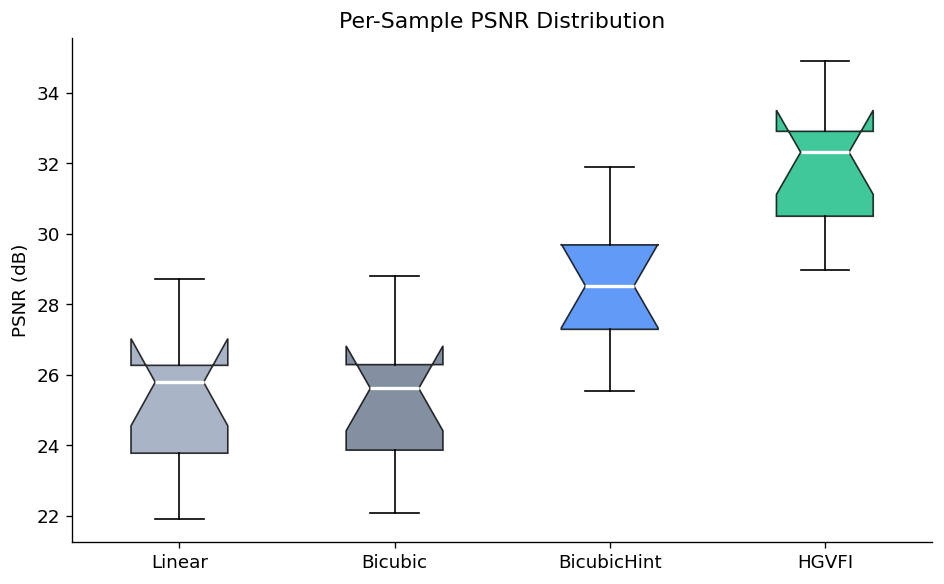

In [158]:
if isinstance(benchmark.get("Linear", {}).get("psnr_scores"), list):
    fig, ax = plt.subplots(figsize=(8, 5))
    data = [benchmark[m]["psnr_scores"] for m in methods]
    bp = ax.boxplot(data, labels=methods, patch_artist=True, notch=True,
                    medianprops={"color": "white", "lw": 2})
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.8)
    ax.set_ylabel("PSNR (dB)")
    ax.set_title("Per-Sample PSNR Distribution")
    plt.tight_layout()
    plt.show()

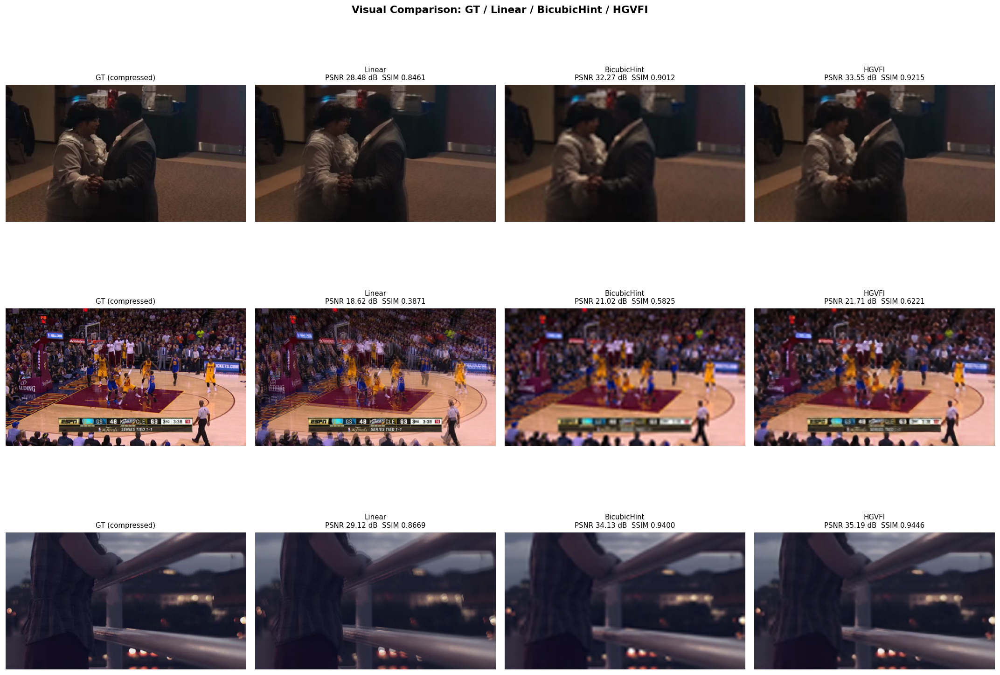

In [159]:
def interpolate_all_methods(model, im1p, im2p, im3p, device):
    f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
    fgt = np.array(Image.open(im2p)).astype(np.float32) / 255.0
    f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0
    f0c = compress_frame_h264(f0,  crf=23)
    f2c = compress_frame_h264(f2,  crf=23)
    fgc = compress_frame_h264(fgt, crf=23)
    h   = downsample_hint(fgc, factor=4)

    preds = {
        "GT (compressed)": fgc,
        "Linear":          (f0c + f2c) / 2.0,
        "BicubicHint":     upsample_hint_bicubic(h, scale=4),
    }
    model.eval()
    with torch.no_grad():
        out = model(numpy_to_tensor(f0c).to(device),
                    numpy_to_tensor(f2c).to(device),
                    numpy_to_tensor(h).to(device))
    preds["HGVFI"] = tensor_to_numpy(out)

    metrics = {}
    for name, pred in preds.items():
        if name != "GT (compressed)":
            p, s = compute_metrics(fgc, pred)
            metrics[name] = (p, s)
    return preds, metrics, fgc


sample_idxs = [0, 150, 500]

fig, axes = plt.subplots(len(sample_idxs), 4, figsize=(18, 4.5 * len(sample_idxs)))

for row, idx in enumerate(sample_idxs):
    preds, metrics, fgc = interpolate_all_methods(model, *test_paths[idx], device)

    for col, (name, img) in enumerate(preds.items()):
        ax = axes[row, col]
        ax.imshow(img.clip(0, 1))
        title = name
        if name in metrics:
            p, s = metrics[name]
            title += f"\nPSNR {p:.2f} dB  SSIM {s:.4f}"
        ax.set_title(title, fontsize=9)
        ax.axis("off")

    axes[row, 0].set_ylabel(f"Sample {idx}", fontsize=10, rotation=0,
                            labelpad=60, va="center")

fig.suptitle("Visual Comparison: GT / Linear / BicubicHint / HGVFI", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

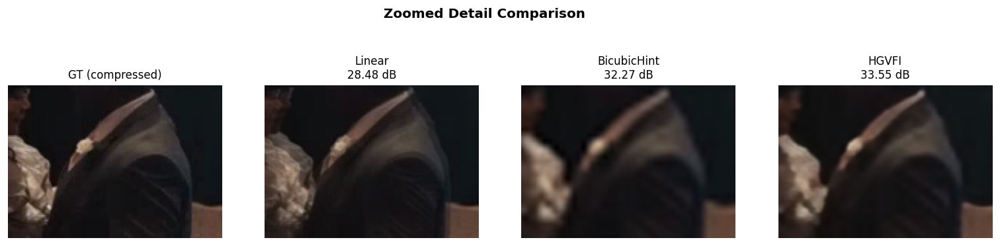

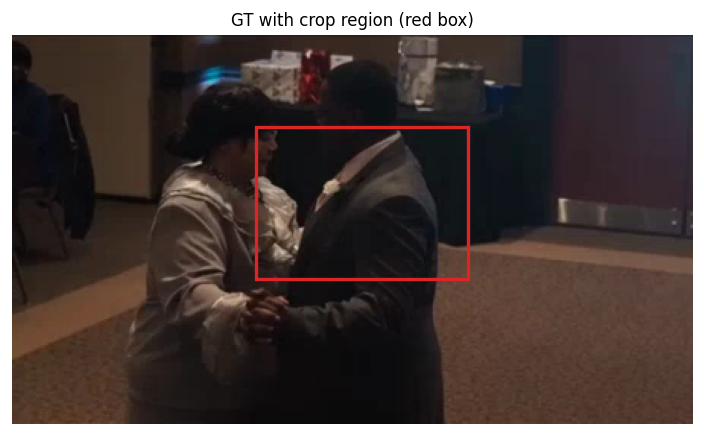

In [160]:
zoom_idx   = 0
crop_y, crop_x, crop_h, crop_w = 60, 160, 100, 140

preds, metrics, fgc = interpolate_all_methods(model, *test_paths[zoom_idx], device)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for ax, (name, img) in zip(axes, preds.items()):
    crop = img.clip(0, 1)[crop_y:crop_y+crop_h, crop_x:crop_x+crop_w]
    ax.imshow(crop)
    title = name
    if name in metrics:
        title += f"\n{metrics[name][0]:.2f} dB"
    ax.set_title(title, fontsize=10)
    ax.axis("off")

fig2, ax2 = plt.subplots(figsize=(6, 4))
ax2.imshow(fgc.clip(0, 1))
rect = plt.Rectangle((crop_x, crop_y), crop_w, crop_h,
                      linewidth=2, edgecolor="#dc2626", facecolor="none")
ax2.add_patch(rect)
ax2.set_title("GT with crop region (red box)", fontsize=10)
ax2.axis("off")

fig.suptitle("Zoomed Detail Comparison", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()
fig2.tight_layout()
plt.show()

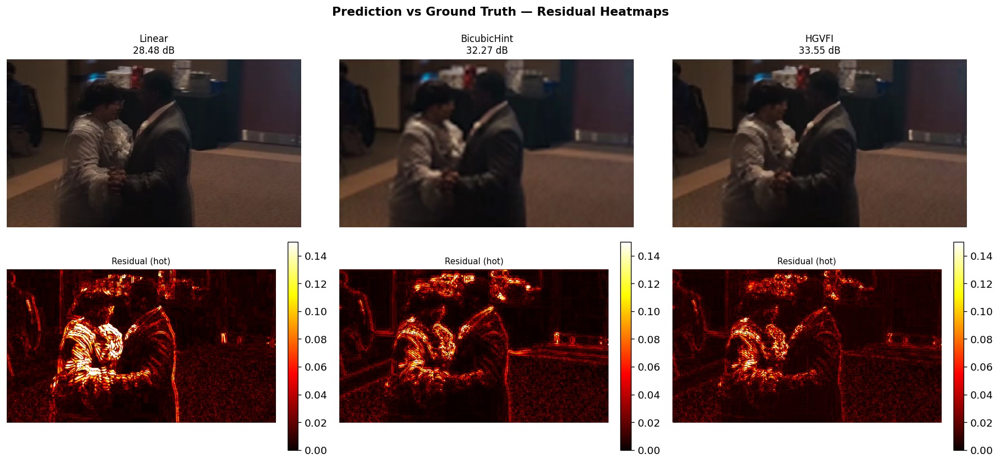

In [161]:
preds, metrics, fgc = interpolate_all_methods(model, *test_paths[0], device)

residual_methods = {k: v for k, v in preds.items() if k != "GT (compressed)"}

fig, axes = plt.subplots(2, len(residual_methods), figsize=(15, 7))

for col, (name, pred) in enumerate(residual_methods.items()):
    p, s = metrics[name]

    axes[0, col].imshow(pred.clip(0, 1))
    axes[0, col].set_title(f"{name}\n{p:.2f} dB", fontsize=10)
    axes[0, col].axis("off")

    residual = np.abs(fgc - pred).mean(axis=2)  # collapse to luminance diff
    im = axes[1, col].imshow(residual, cmap="hot", vmin=0, vmax=0.15)
    axes[1, col].set_title("Residual (hot)", fontsize=9)
    axes[1, col].axis("off")
    plt.colorbar(im, ax=axes[1, col], fraction=0.046, pad=0.04)

fig.suptitle("Prediction vs Ground Truth — Residual Heatmaps", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

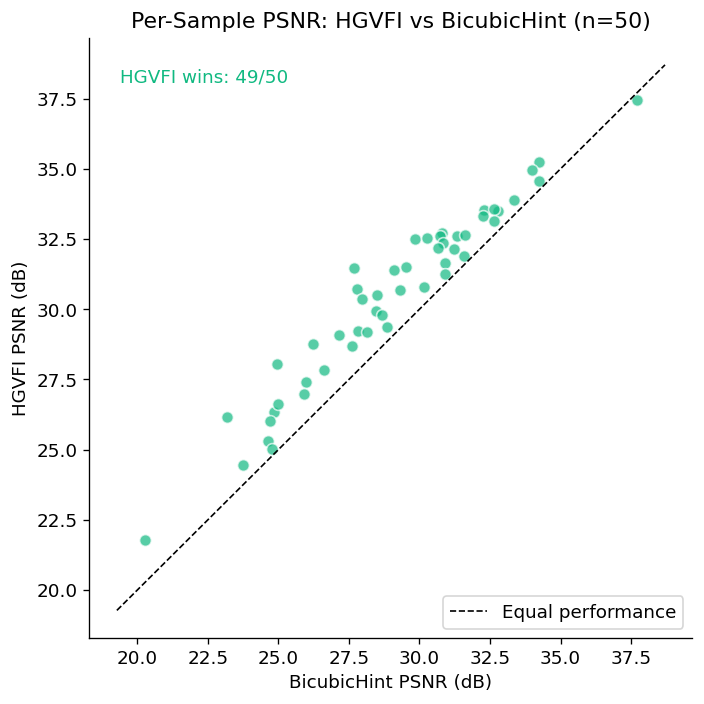

In [162]:
N_SCATTER = 50
psnr_bichint, psnr_hgvfi = [], []

model.eval()
for im1p, im2p, im3p in test_paths[:N_SCATTER]:
    f0c = compress_frame_h264(np.array(Image.open(im1p)).astype(np.float32)/255.0, crf=23)
    f2c = compress_frame_h264(np.array(Image.open(im3p)).astype(np.float32)/255.0, crf=23)
    fgc = compress_frame_h264(np.array(Image.open(im2p)).astype(np.float32)/255.0, crf=23)
    h   = downsample_hint(fgc, factor=4)

    p_bh, _ = compute_metrics(fgc, upsample_hint_bicubic(h, scale=4))
    with torch.no_grad():
        out = model(numpy_to_tensor(f0c).to(device),
                    numpy_to_tensor(f2c).to(device),
                    numpy_to_tensor(h).to(device))
    p_hg, _ = compute_metrics(fgc, tensor_to_numpy(out))

    psnr_bichint.append(p_bh)
    psnr_hgvfi.append(p_hg)

fig, ax = plt.subplots(figsize=(6, 6))
lo = min(min(psnr_bichint), min(psnr_hgvfi)) - 1
hi = max(max(psnr_bichint), max(psnr_hgvfi)) + 1
ax.plot([lo, hi], [lo, hi], "k--", lw=1, label="Equal performance")
ax.scatter(psnr_bichint, psnr_hgvfi, alpha=0.7, color="#10b981", edgecolors="white", s=50)
ax.set_xlabel("BicubicHint PSNR (dB)")
ax.set_ylabel("HGVFI PSNR (dB)")
ax.set_title(f"Per-Sample PSNR: HGVFI vs BicubicHint (n={N_SCATTER})")
ax.legend()

wins = sum(h > b for h, b in zip(psnr_hgvfi, psnr_bichint))
ax.text(0.05, 0.95, f"HGVFI wins: {wins}/{N_SCATTER}",
        transform=ax.transAxes, fontsize=11, color="#10b981", va="top")
plt.tight_layout()
plt.show()

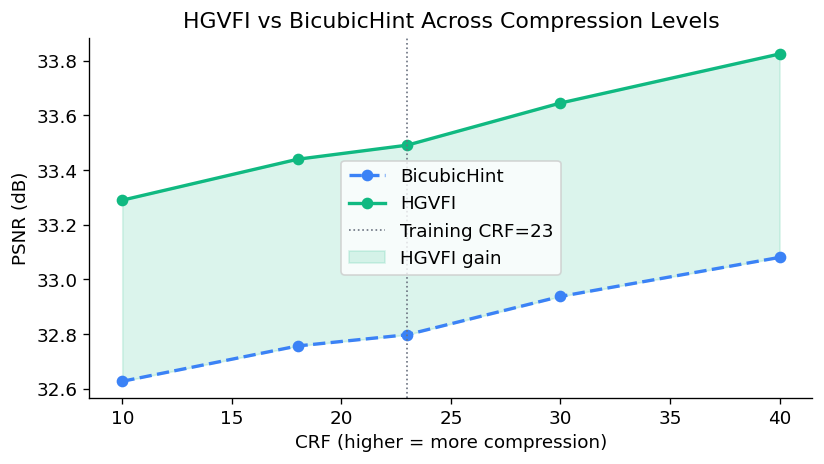

In [64]:
CRF_TEST = [10, 18, 23, 30, 40]
sample = test_paths[5]
im1p, im2p, im3p = sample

raw_f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
raw_fgt = np.array(Image.open(im2p)).astype(np.float32) / 255.0
raw_f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0

psnr_hgvfi_crf, psnr_bichint_crf = [], []

model.eval()
for crf in CRF_TEST:
    f0c = compress_frame_h264(raw_f0,  crf=crf)
    f2c = compress_frame_h264(raw_f2,  crf=crf)
    fgc = compress_frame_h264(raw_fgt, crf=crf)
    h   = downsample_hint(fgc, factor=4)

    p_bh, _ = compute_metrics(fgc, upsample_hint_bicubic(h, scale=4))
    with torch.no_grad():
        out = model(numpy_to_tensor(f0c).to(device),
                    numpy_to_tensor(f2c).to(device),
                    numpy_to_tensor(h).to(device))
    p_hg, _ = compute_metrics(fgc, tensor_to_numpy(out))

    psnr_hgvfi_crf.append(p_hg)
    psnr_bichint_crf.append(p_bh)

fig, ax = plt.subplots(figsize=(7, 4))
ax.plot(CRF_TEST, psnr_bichint_crf, "o--", color="#3b82f6", lw=2, label="BicubicHint")
ax.plot(CRF_TEST, psnr_hgvfi_crf,   "o-",  color="#10b981", lw=2, label="HGVFI")
ax.axvline(23, color="#6b7280", ls=":", lw=1, label="Training CRF=23")
ax.fill_between(CRF_TEST,
                psnr_bichint_crf, psnr_hgvfi_crf,
                alpha=0.15, color="#10b981", label="HGVFI gain")
ax.set_xlabel("CRF (higher = more compression)")
ax.set_ylabel("PSNR (dB)")
ax.set_title("HGVFI vs BicubicHint Across Compression Levels")
ax.legend()
plt.tight_layout()
plt.show()

In [65]:
class EMAVFINoHint(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1 = nn.Conv2d(3,   32,  3, stride=1, padding=1)
        self.enc2 = nn.Conv2d(32,  64,  3, stride=2, padding=1)
        self.enc3 = nn.Conv2d(64,  128, 3, stride=2, padding=1)
        self.enc4 = nn.Conv2d(128, 256, 3, stride=2, padding=1)

        self.cfa_blocks     = nn.ModuleList([CrossFrameAttention(256) for _ in range(8)])
        self.flow_estimator = FlowEstimator(256)
        self.warp_layer     = WarpLayer()

        self.dec3 = nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1)
        self.dec2 = nn.ConvTranspose2d(128, 64,  4, stride=2, padding=1)
        self.dec1 = nn.ConvTranspose2d(64,  32,  4, stride=2, padding=1)

        self.coarse_head  = nn.Conv2d(32, 3, 3, padding=1)
        self.refine_conv1 = nn.Conv2d(3 + 32, 64, 3, padding=1)
        self.refine_conv2 = nn.Conv2d(64, 64, 3, padding=1)
        self.refine_out   = nn.Conv2d(64, 3,  3, padding=1)

    def _encode_frame(self, frame):
        e1 = F.relu(self.enc1(frame))
        e2 = F.relu(self.enc2(e1))
        e3 = F.relu(self.enc3(e2))
        e4 = F.relu(self.enc4(e3))
        return e4

    def forward(self, frame0, frame2):
        e4_0 = self._encode_frame(frame0)
        e4_2 = self._encode_frame(frame2)

        e4_att = e4_0
        for blk in self.cfa_blocks:
            e4_att = blk(e4_att, e4_2)

        flow_coarse = self.flow_estimator(e4_att)
        H_full, W_full = frame0.shape[2], frame0.shape[3]
        flow_up = F.interpolate(flow_coarse, size=(H_full, W_full),
                                mode="bilinear", align_corners=False)
        scale_h = H_full / flow_coarse.shape[2]
        scale_w = W_full / flow_coarse.shape[3]
        flow_up = flow_up * torch.tensor(
            [scale_w, scale_h, scale_w, scale_h], device=flow_up.device
        ).view(1, 4, 1, 1)
        warped0      = self.warp_layer(frame0, flow_up[:, :2] * 0.5)
        warped2      = self.warp_layer(frame2, flow_up[:, 2:] * 0.5)
        warped_blend = (warped0 + warped2) * 0.5

        d3 = F.relu(self.dec3(e4_att))
        d2 = F.relu(self.dec2(d3))
        d1 = F.relu(self.dec1(d2))

        coarse_decoder = torch.sigmoid(self.coarse_head(d1))
        coarse = torch.clamp(0.5 * coarse_decoder + 0.5 * warped_blend, 0.0, 1.0)

        x = F.relu(self.refine_conv1(torch.cat([coarse, d1], dim=1)))
        x = F.relu(self.refine_conv2(x))
        return torch.sigmoid(coarse + self.refine_out(x))


def train_epoch_v2(model, dataloader, optimizer, loss_fn, device, use_hint=True):
    model.train()
    total_loss, n = 0, 0
    for batch in dataloader:
        f0 = batch["frame0"].to(device)
        f2 = batch["frame2"].to(device)
        gt = batch["gt"].to(device)

        out  = model(f0, f2, batch["hint"].to(device)) if use_hint else model(f0, f2)
        loss = loss_fn(out, gt)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        total_loss += loss.item()
        n += 1
    return total_loss / n


def validate_v2(model, val_paths, device, num_samples=200, use_hint=True):
    model.eval()
    psnr_list, ssim_list = [], []
    with torch.no_grad():
        for im1p, im2p, im3p in val_paths[:num_samples]:
            f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
            fgt = np.array(Image.open(im2p)).astype(np.float32) / 255.0
            f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0
            f0c = compress_frame_h264(f0,  crf=23)
            f2c = compress_frame_h264(f2,  crf=23)

            if use_hint:
                fgc = compress_frame_h264(fgt, crf=23)
                h   = downsample_hint(fgc, factor=4)
                out = model(numpy_to_tensor(f0c).to(device),
                            numpy_to_tensor(f2c).to(device),
                            numpy_to_tensor(h).to(device))
            else:
                out = model(numpy_to_tensor(f0c).to(device),
                            numpy_to_tensor(f2c).to(device))

            psnr, ssim = compute_metrics(fgt, tensor_to_numpy(out))
            psnr_list.append(psnr)
            ssim_list.append(ssim)

    return np.mean(psnr_list), np.mean(ssim_list)


def run_training_v2(train_paths, val_paths, model, device,
                    num_epochs=8, batch_size=4, lr=2e-4, limit=None, use_hint=True):
    if limit:
        train_paths = train_paths[:limit]
        val_paths   = val_paths[:limit]

    train_ds = Vimeo90KDataset(train_paths, crop_size=256, use_augmentation=True)
    loader   = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
    loss_fn   = CharbonnierLoss(eps=1e-6)

    history = {"train_loss": [], "val_psnr": [], "val_ssim": []}

    for epoch in range(1, num_epochs + 1):
        train_loss = train_epoch_v2(model, loader, optimizer, loss_fn, device, use_hint)
        scheduler.step()
        val_psnr, val_ssim = validate_v2(
            model, val_paths, device,
            num_samples=min(200, len(val_paths)), use_hint=use_hint
        )
        history["train_loss"].append(train_loss)
        history["val_psnr"].append(val_psnr)
        history["val_ssim"].append(val_ssim)

        print(
            f"Epoch {epoch:02d}/{num_epochs} | "
            f"loss {train_loss:.4f} | "
            f"PSNR {val_psnr:.2f} | "
            f"SSIM {val_ssim:.4f}"
        )

    return history


model_nohint = EMAVFINoHint().to(device)
print(f"NoHint model params: {sum(p.numel() for p in model_nohint.parameters()):,}")

NoHint model params: 7,821,642


Epoch 01/12 | loss 0.0809 | PSNR 19.92 | SSIM 0.5983
Epoch 02/12 | loss 0.0659 | PSNR 20.11 | SSIM 0.6028
Epoch 03/12 | loss 0.0690 | PSNR 19.81 | SSIM 0.5987
Epoch 04/12 | loss 0.0644 | PSNR 19.96 | SSIM 0.6142
Epoch 05/12 | loss 0.0645 | PSNR 20.20 | SSIM 0.6210
Epoch 06/12 | loss 0.0614 | PSNR 20.22 | SSIM 0.6242
Epoch 07/12 | loss 0.0609 | PSNR 20.14 | SSIM 0.6292
Epoch 08/12 | loss 0.0613 | PSNR 20.49 | SSIM 0.6315
Epoch 09/12 | loss 0.0594 | PSNR 20.60 | SSIM 0.6382
Epoch 10/12 | loss 0.0588 | PSNR 20.60 | SSIM 0.6416
Epoch 11/12 | loss 0.0586 | PSNR 20.71 | SSIM 0.6431
Epoch 12/12 | loss 0.0583 | PSNR 20.66 | SSIM 0.6434


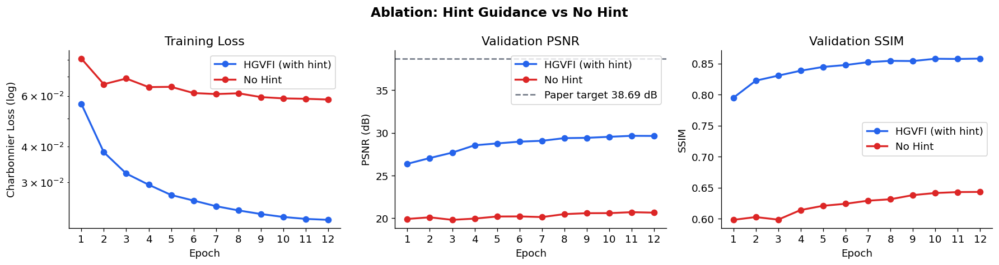

In [163]:
history_nohint = run_training_v2(
    train_paths, test_paths, model_nohint, device,
    num_epochs=12, limit=100, use_hint=False
)

epochs = list(range(1, len(history["train_loss"]) + 1))
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = axes[0]
ax.plot(epochs, history["train_loss"],        "o-", color="#2563eb", lw=2, label="HGVFI (with hint)")
ax.plot(epochs, history_nohint["train_loss"], "o-", color="#dc2626", lw=2, label="No Hint")
ax.set_yscale("log")
ax.set_xlabel("Epoch"); ax.set_ylabel("Charbonnier Loss (log)")
ax.set_title("Training Loss"); ax.legend(); ax.set_xticks(epochs)

ax = axes[1]
ax.plot(epochs, history["val_psnr"],        "o-", color="#2563eb", lw=2, label="HGVFI (with hint)")
ax.plot(epochs, history_nohint["val_psnr"], "o-", color="#dc2626", lw=2, label="No Hint")
ax.axhline(38.69, ls="--", color="#6b7280", lw=1.5, label="Paper target 38.69 dB")
ax.set_xlabel("Epoch"); ax.set_ylabel("PSNR (dB)")
ax.set_title("Validation PSNR"); ax.legend(); ax.set_xticks(epochs)

ax = axes[2]
ax.plot(epochs, history["val_ssim"],        "o-", color="#2563eb", lw=2, label="HGVFI (with hint)")
ax.plot(epochs, history_nohint["val_ssim"], "o-", color="#dc2626", lw=2, label="No Hint")
ax.set_xlabel("Epoch"); ax.set_ylabel("SSIM")
ax.set_title("Validation SSIM"); ax.legend(); ax.set_xticks(epochs)

fig.suptitle("Ablation: Hint Guidance vs No Hint", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

In [164]:
model_nohint.eval()
nohint_psnr, nohint_ssim = [], []

with torch.no_grad():
    for im1p, im2p, im3p in _test_paths[:100]:
        f0  = np.array(Image.open(im1p)).astype(np.float32) / 255.0
        fgt = np.array(Image.open(im2p)).astype(np.float32) / 255.0
        f2  = np.array(Image.open(im3p)).astype(np.float32) / 255.0
        f0c = compress_frame_h264(f0, crf=23)
        f2c = compress_frame_h264(f2, crf=23)
        out = model_nohint(numpy_to_tensor(f0c).to(device),
                           numpy_to_tensor(f2c).to(device))
        p, s = compute_metrics(fgt, tensor_to_numpy(out))
        nohint_psnr.append(p)
        nohint_ssim.append(s)

benchmark["NoHint"] = {
    "psnr_mean":   float(np.mean(nohint_psnr)),
    "psnr_std":    float(np.std(nohint_psnr)),
    "ssim_mean":   float(np.mean(nohint_ssim)),
    "ssim_std":    float(np.std(nohint_ssim)),
    "psnr_scores": nohint_psnr,
    "ssim_scores": nohint_ssim,
}

print(f"\n{'Method':<15} {'PSNR (dB)':<25} {'SSIM'}")
print("-" * 60)
for method, m in benchmark.items():
    print(f"{method:<15} {m['psnr_mean']:.2f} ± {m['psnr_std']:.2f}{'':8} {m['ssim_mean']:.4f} ± {m['ssim_std']:.4f}")


Method          PSNR (dB)                 SSIM
------------------------------------------------------------
Linear          25.25 ± 1.82         0.8313 ± 0.0514
Bicubic         25.33 ± 1.84         0.8310 ± 0.0488
BicubicHint     28.43 ± 1.92         0.8831 ± 0.0406
HGVFI           31.86 ± 1.65         0.9080 ± 0.0275
NoHint          23.60 ± 2.76         0.7584 ± 0.1438


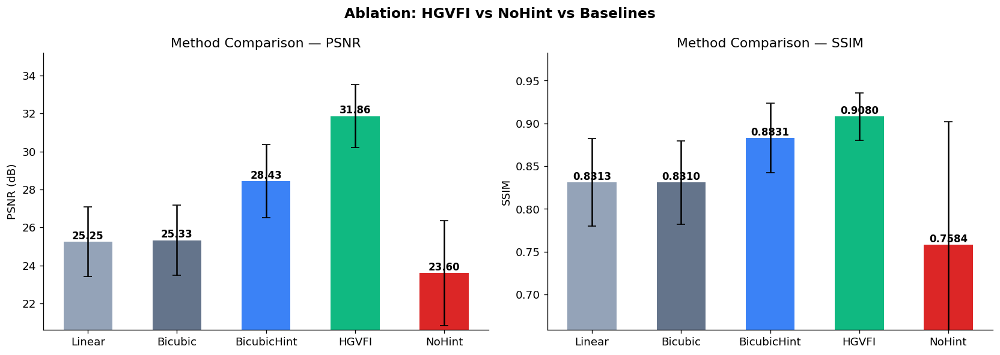

In [165]:
methods_all = list(benchmark.keys())
psnr_means  = [benchmark[m]["psnr_mean"] for m in methods_all]
psnr_stds   = [benchmark[m]["psnr_std"]  for m in methods_all]
ssim_means  = [benchmark[m]["ssim_mean"] for m in methods_all]
ssim_stds   = [benchmark[m]["ssim_std"]  for m in methods_all]
colors_all  = ["#94a3b8", "#64748b", "#3b82f6", "#10b981", "#dc2626"]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
bars = ax.bar(methods_all, psnr_means, yerr=psnr_stds, color=colors_all,
              capsize=4, width=0.55, error_kw={"lw": 1.5})
for bar, v in zip(bars, psnr_means):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.15,
            f"{v:.2f}", ha="center", fontsize=10, fontweight="bold")
ax.set_ylabel("PSNR (dB)"); ax.set_title("Method Comparison — PSNR")
ax.set_ylim(bottom=max(0, min(psnr_means) - 3))

ax = axes[1]
bars = ax.bar(methods_all, ssim_means, yerr=ssim_stds, color=colors_all,
              capsize=4, width=0.55, error_kw={"lw": 1.5})
for bar, v in zip(bars, ssim_means):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f"{v:.4f}", ha="center", fontsize=10, fontweight="bold")
ax.set_ylabel("SSIM"); ax.set_title("Method Comparison — SSIM")
ax.set_ylim(bottom=max(0, min(ssim_means) - 0.1))

fig.suptitle("Ablation: HGVFI vs NoHint vs Baselines", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()